# Notebook to perform the clustering analysis of the integrated data


In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [3]:
adata = sc.read('../results/scVI/S2_scVIintegrated_adata.h5ad')
adata.X.shape

(149617, 31625)

In [4]:
# Run PCA
sc.tl.pca(adata)

computing PCA
    with n_comps=50
    finished (0:03:07)


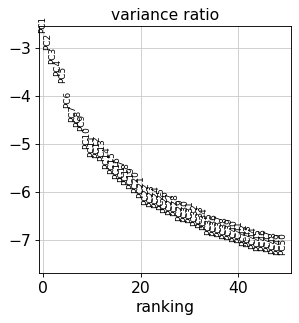

In [5]:
#adata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=50, save='_.pdf')

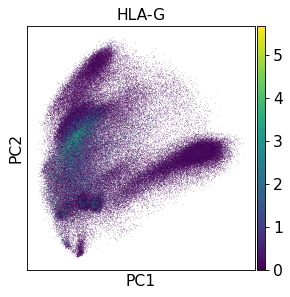

In [6]:
sc.pl.pca(adata, color="HLA-G")

In [7]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.leiden(adata, key_added="leiden_pca")
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)
running Leiden clustering
    finished: found 65 clusters and added
    'leiden_pca', the cluster labels (adata.obs, categorical) (0:00:30)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:36)


In [8]:
adata

AnnData object with n_obs × n_vars = 149617 × 31625
    obs: 'n_genes', 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_pca'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_cells-9'
    uns: '_scvi', 'donor_so

In [9]:
def doublet_assing(adata_obj, cell_id):
    
    '''
    Function that assigns the "doublet" label to the cells that were pooled
    
    input
        adata_obj: adata object
        cell_id:

    '''
    
    #is_doublet label of the current cell, it's a boolean value
    curr_isDoublet = adata_obj.obs.loc[cell_id, 'is_doublet']


    #If the is_doublet is True, then the function willl return the "doublet"
    # Otherwise it will return the "singlet". 
    if curr_isDoublet == True:
        return("doublet")
    
    else:
        return("singlet")

    

In [10]:
adata.obs['scrublet_doublet'] = adata.obs['sample_barcode'].apply(lambda x: doublet_assing(adata,x))

In [11]:
adata.obs

,n_genes,sample,donor,termination,day,pcw,percent_mito,n_counts,batch,sample_barcode,...,zscore,bh_pval,bonf_pval,is_doublet,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,leiden_pca,scrublet_doublet
Pla_HDBR10917729_AAACCCACATCGAACT,1938,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.004617,6715.0,0,Pla_HDBR10917729_AAACCCACATCGAACT,...,-0.321049,0.915588,1.0,False,0,0,9.276571,1.454397,14,singlet
Pla_HDBR10917729_AAACCCAGTAAGACCG,449,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.008159,858.0,0,Pla_HDBR10917729_AAACCCAGTAAGACCG,...,-1.556773,0.950031,1.0,False,0,0,9.276571,1.454397,18,singlet
Pla_HDBR10917729_AAACCCAGTGGGATTG,779,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.005693,1581.0,0,Pla_HDBR10917729_AAACCCAGTGGGATTG,...,-0.321049,0.915588,1.0,False,0,0,9.276571,1.454397,52,singlet
Pla_HDBR10917729_AAACGAAAGCCTAACT,1177,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.047320,3022.0,0,Pla_HDBR10917729_AAACGAAAGCCTAACT,...,-1.400985,0.950031,1.0,False,0,0,9.276571,1.454397,18,singlet
Pla_HDBR10917729_AAACGAAAGCCTGGAA,3605,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.066152,11005.0,0,Pla_HDBR10917729_AAACGAAAGCCTGGAA,...,0.965975,0.870682,1.0,False,0,0,9.276571,1.454397,13,singlet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pla_HDBR11345033_TTTGTTGGTAAGATAC,628,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.030624,849.0,11,Pla_HDBR11345033_TTTGTTGGTAAGATAC,...,-0.207729,0.780360,1.0,False,11,0,8.319507,2.655493,7,singlet
Pla_HDBR11345033_TTTGTTGGTCCCTGTT,690,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.054726,1005.0,11,Pla_HDBR11345033_TTTGTTGGTCCCTGTT,...,0.000000,0.780360,1.0,False,11,0,8.319507,2.655493,7,singlet
Pla_HDBR11345033_TTTGTTGGTCGGCACT,742,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.029722,1043.0,11,Pla_HDBR11345033_TTTGTTGGTCGGCACT,...,-0.207729,0.780360,1.0,False,11,0,8.319507,2.655493,7,singlet
Pla_HDBR11345033_TTTGTTGGTCTCCCTA,633,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.046256,908.0,11,Pla_HDBR11345033_TTTGTTGGTCTCCCTA,...,0.215942,0.780360,1.0,False,11,0,8.319507,2.655493,7,singlet


In [12]:
adata

AnnData object with n_obs × n_vars = 149617 × 31625
    obs: 'n_genes', 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_pca', 'scrublet_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_cells-9'
    uns

... storing 'scrublet_doublet' as categorical


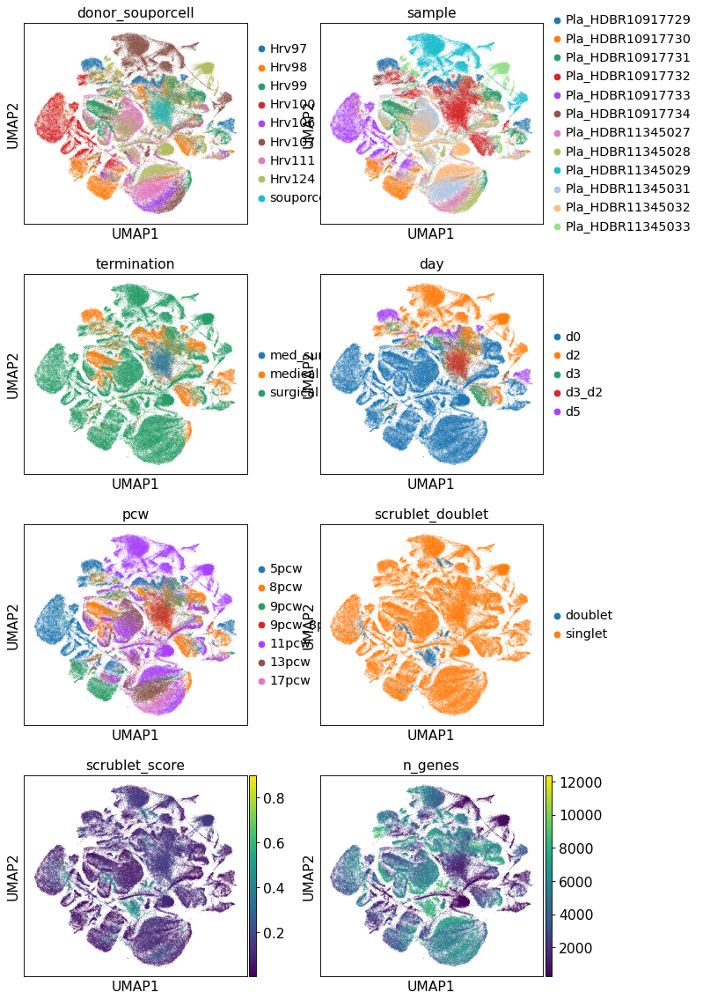

In [13]:
sc.pl.umap(adata, color=['donor_souporcell','sample', 'termination', 
                         'day','pcw', 'scrublet_doublet','scrublet_score','n_genes'], ncols = 2, save='_normal.pdf')

In [14]:
adata

AnnData object with n_obs × n_vars = 149617 × 31625
    obs: 'n_genes', 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_pca', 'scrublet_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_cells-9'
    uns

In [15]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_scVI_n_latent_10")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:55)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:42)


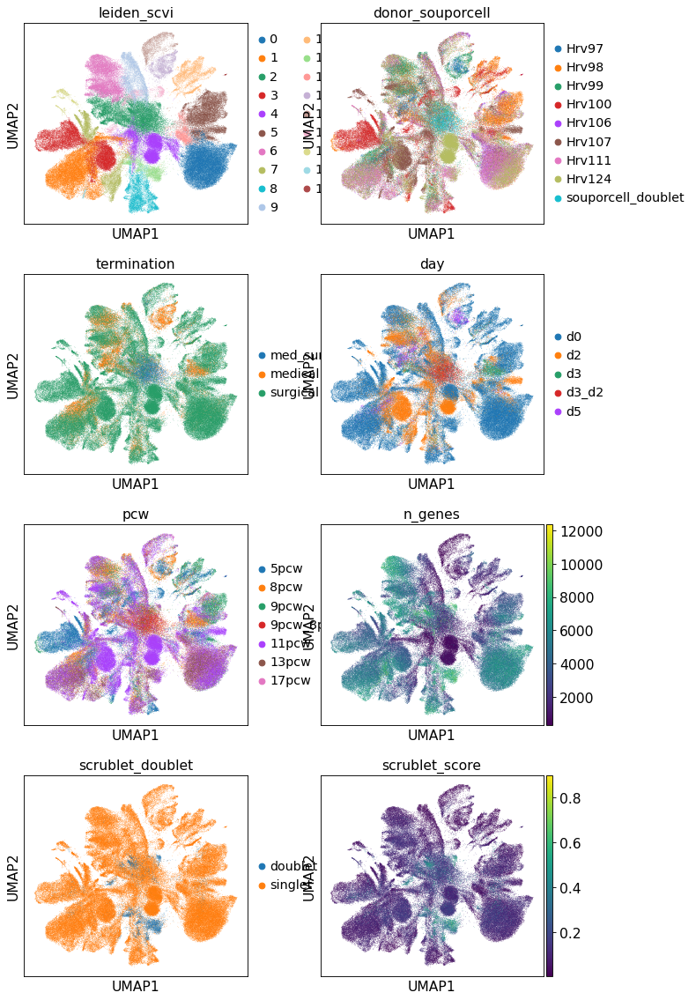

In [16]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell', 'termination', 
                         'day','pcw','n_genes', 'scrublet_doublet','scrublet_score' ], ncols=2, save='_scVI_latent10.pdf')

In [21]:
#LATENT 20
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_scVI_n_latent_20")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:27)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:41)


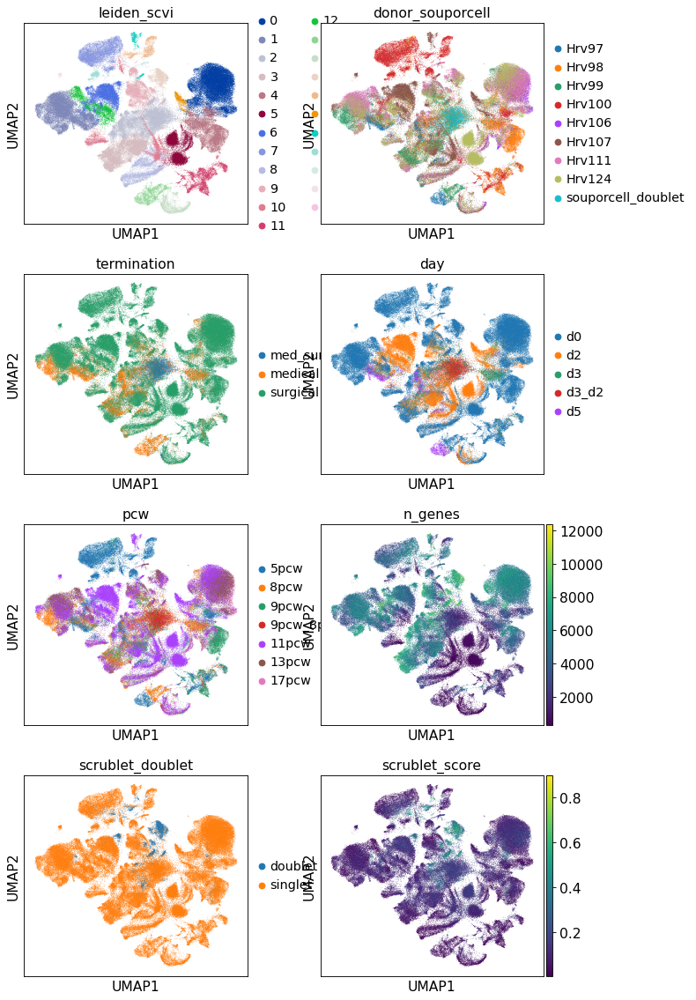

In [22]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell', 'termination', 
                         'day','pcw','n_genes', 'scrublet_doublet','scrublet_score' ], ncols=2, save='_scVI_latent20.pdf')

In [17]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:09)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:30)


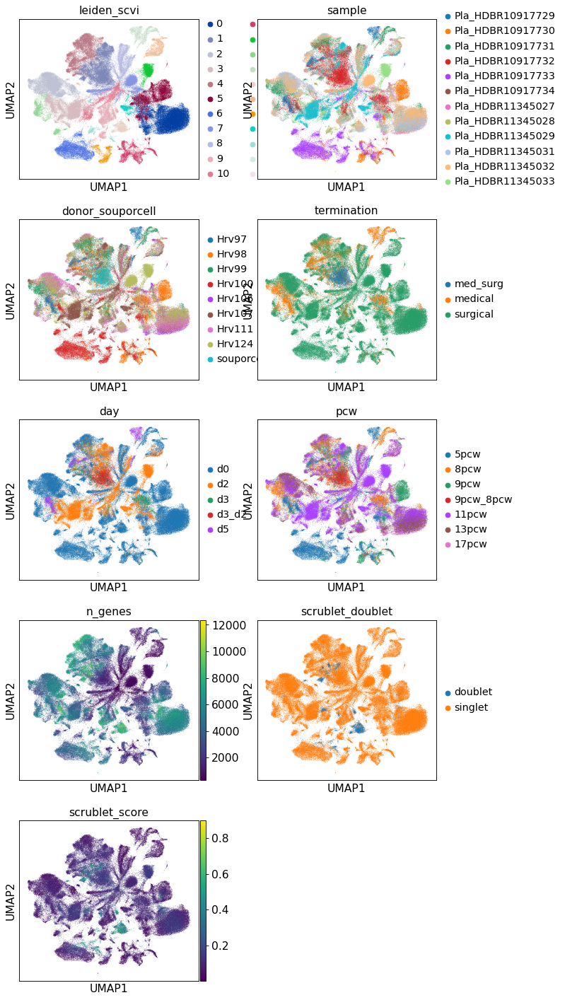

In [18]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample','donor_souporcell', 'termination', 
                         'day','pcw','n_genes','scrublet_doublet','scrublet_score' ], ncols=2, save='_scVI_latent30.pdf')

In [19]:
#LATENT 40
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_scVI_n_latent_40")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:53)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:34)


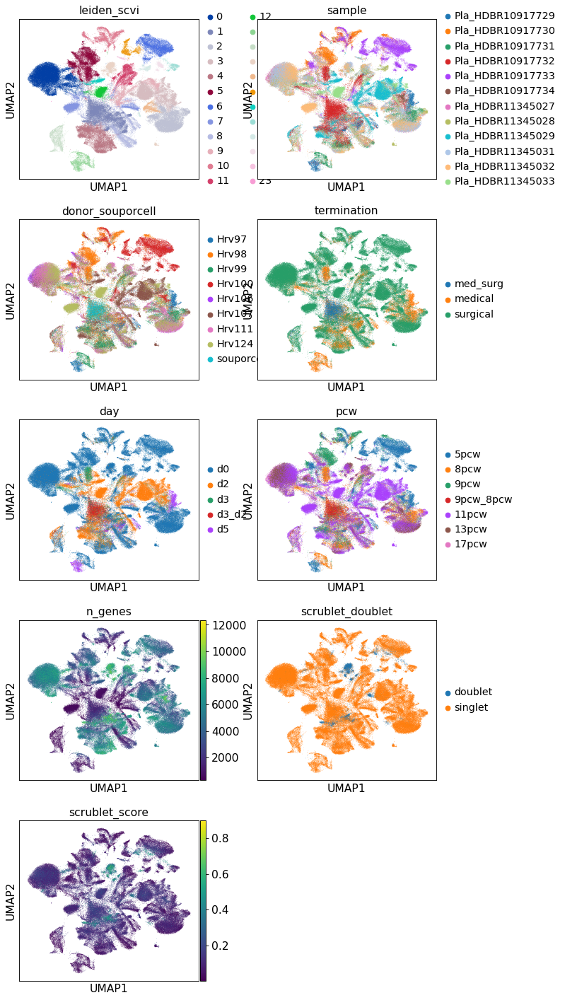

In [20]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample','donor_souporcell', 'termination', 
                         'day','pcw','n_genes','scrublet_doublet','scrublet_score' ], ncols=2, save='_scVI_latent40.pdf')

In [23]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:20)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:30)


In [24]:
adata

AnnData object with n_obs × n_vars = 149617 × 31625
    obs: 'n_genes', 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden_pca', 'scrublet_doublet', 'leiden_scvi'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_c

### Saving the object with use_rep="X_scVI_n_latent_30"

In [25]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30.h5ad')

In [26]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30.h5ad')

### Marker plots

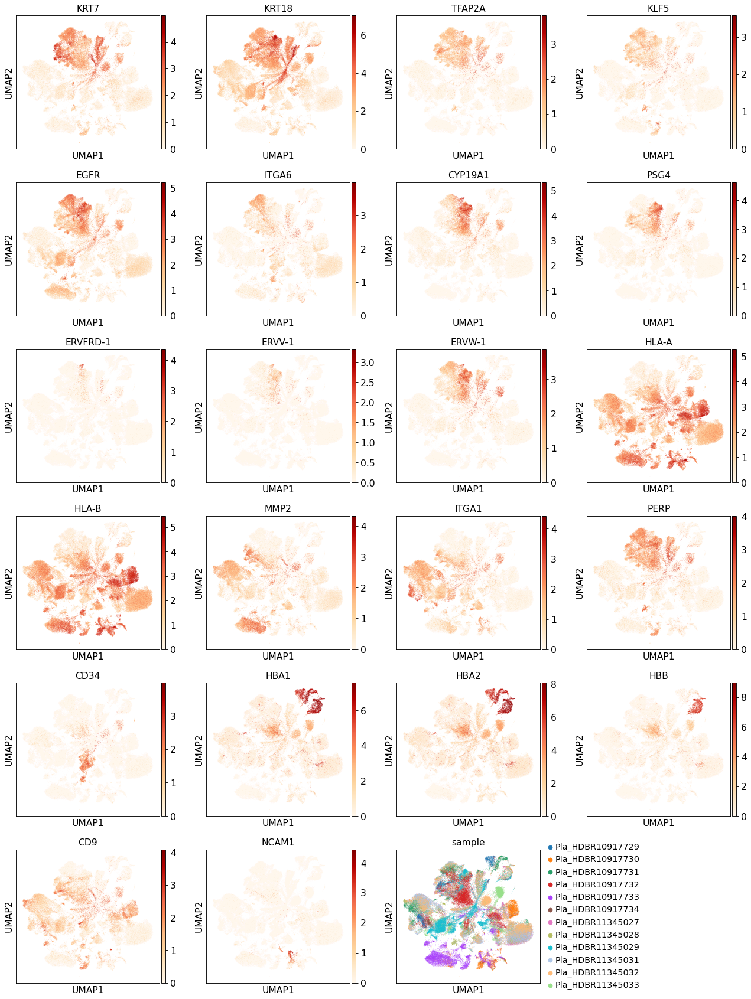

In [27]:
sc.pl.umap(adata, color=['KRT7','KRT18', 'TFAP2A', 'KLF5', 'EGFR' ,'ITGA6', 'CYP19A1','PSG4','ERVFRD-1', 'ERVV-1', 'ERVW-1', 
                         'HLA-A','HLA-B', 'MMP2', 'ITGA1', 'PERP', 'CD34', 'HBA1','HBA2','HBB',
                         'CD9','NCAM1','sample'],color_map='OrRd', save='_otherMarkers_scVI_latent30.pdf')

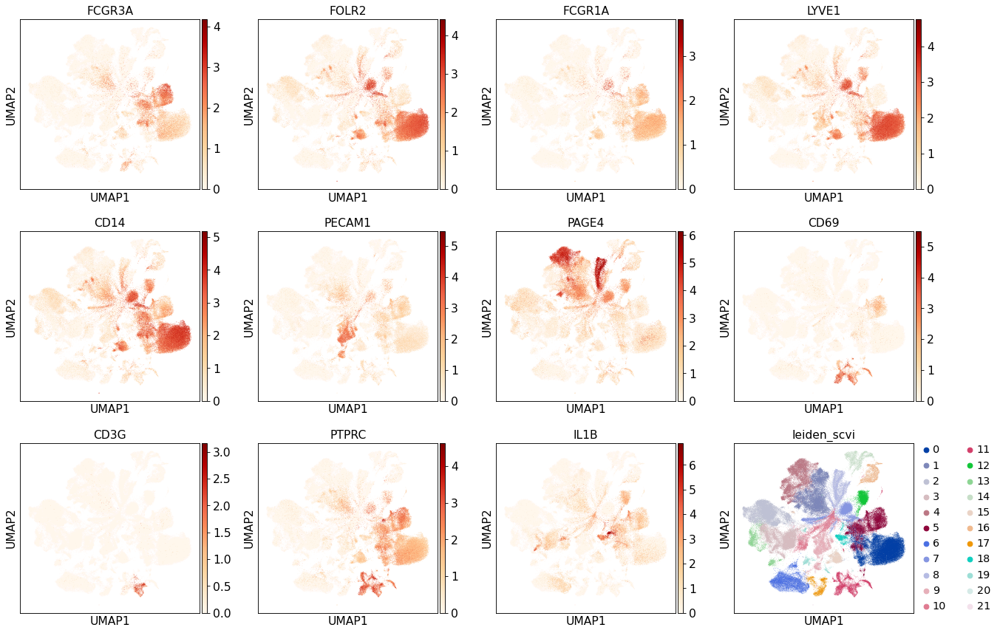

In [28]:
sc.pl.umap(adata, color=['FCGR3A', 'FOLR2', 'FCGR1A', 'LYVE1', 'CD14','PECAM1','PAGE4',
                         'CD69', 'CD3G','PTPRC','IL1B','leiden_scvi'],color_map='OrRd', save='_placentaImmuneMarkers_scVI_latent30.pdf')

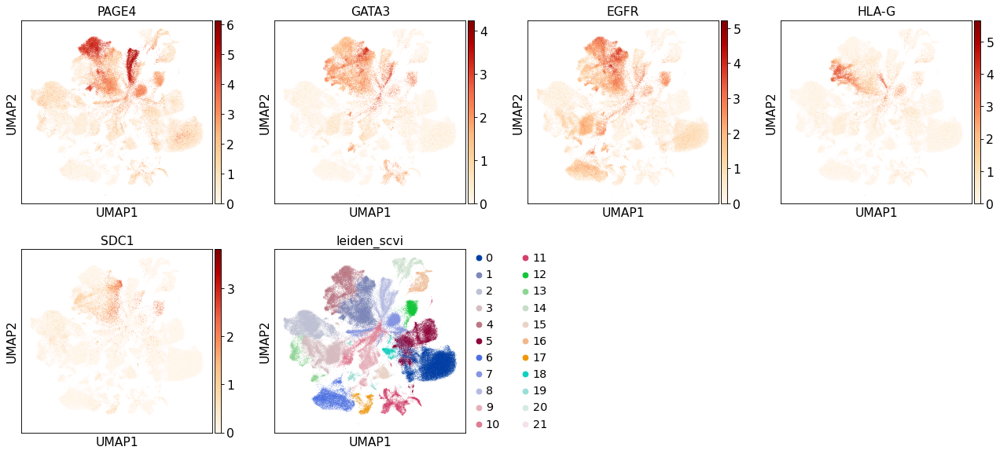

In [29]:
sc.pl.umap(adata, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden_scvi']
           ,color_map='OrRd', save='_trophoblastMarkers_scVI_latent30.pdf')

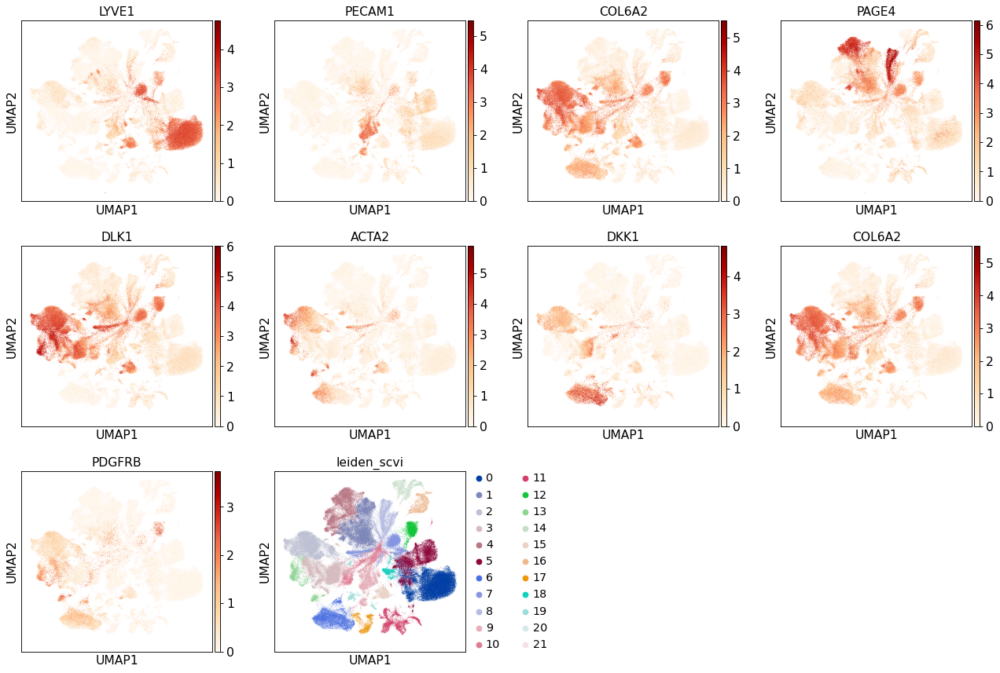

In [30]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2','DKK1', 'COL6A2','PDGFRB', 'leiden_scvi'],color_map='OrRd', save='_placentaMarkers_scVI_latent30.pdf')

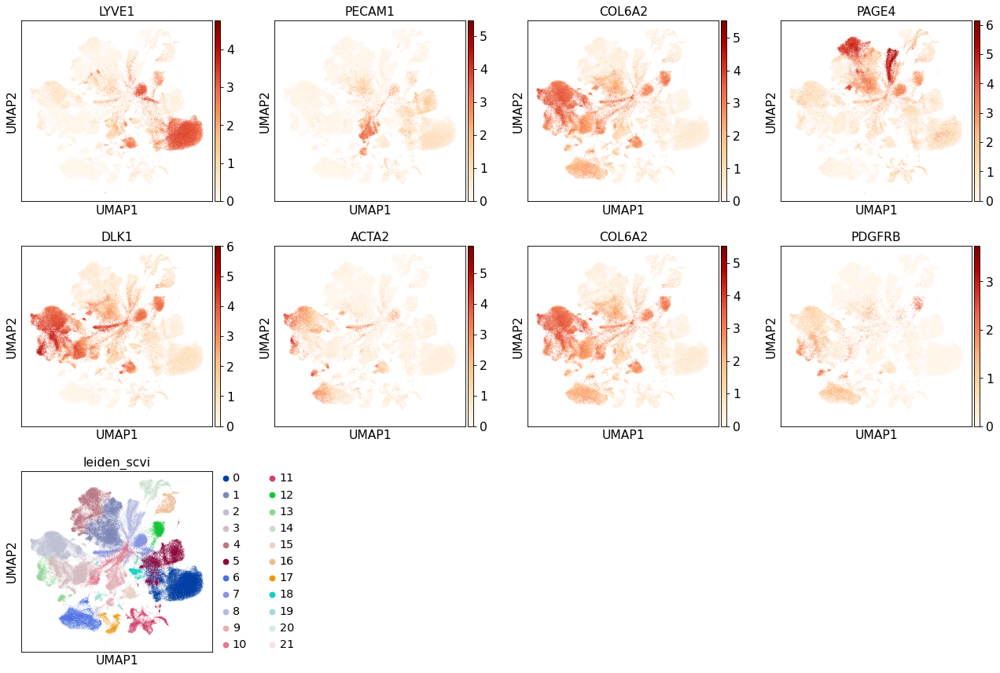

In [31]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2', 'COL6A2','PDGFRB', 'leiden_scvi'],color_map='OrRd')

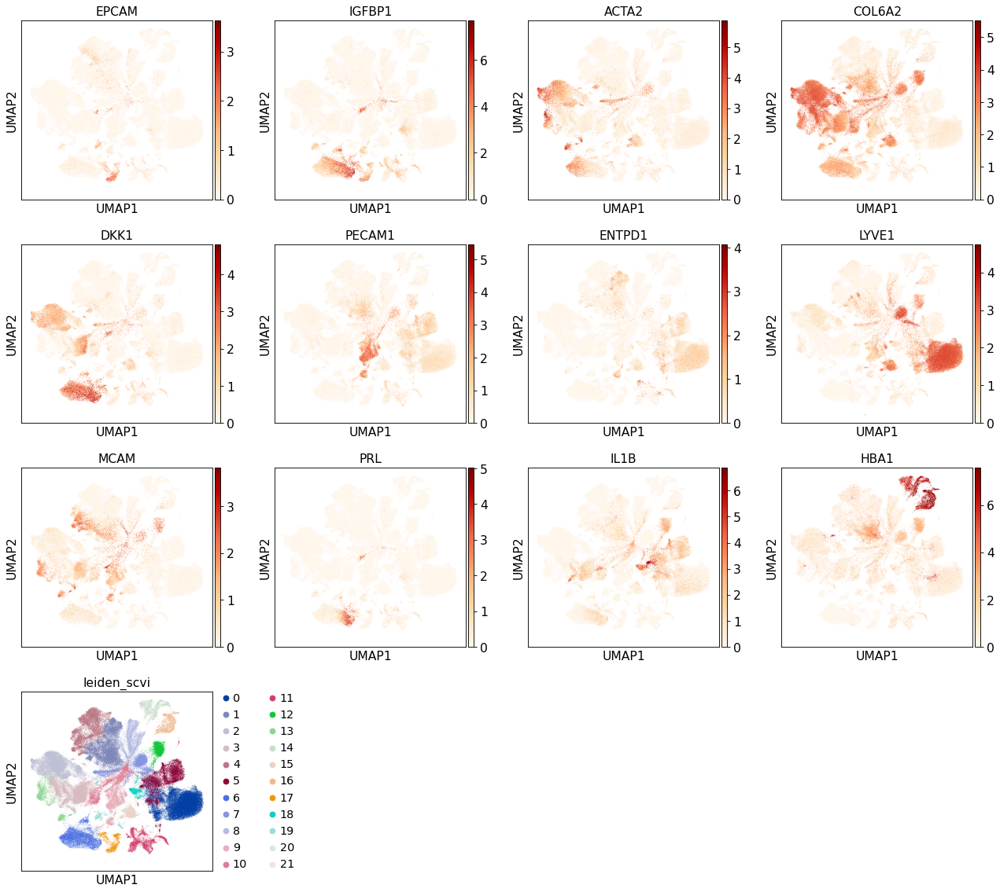

In [32]:
sc.pl.umap(adata, color=['EPCAM', 'IGFBP1', 'ACTA2', 'COL6A2', 'DKK1','PECAM1','ENTPD1', 'LYVE1', 'MCAM',
                         'PRL','IL1B','HBA1',''
                         'leiden_scvi'],color_map='OrRd', save='_deciduaMarkers_scVI_latent30.pdf')

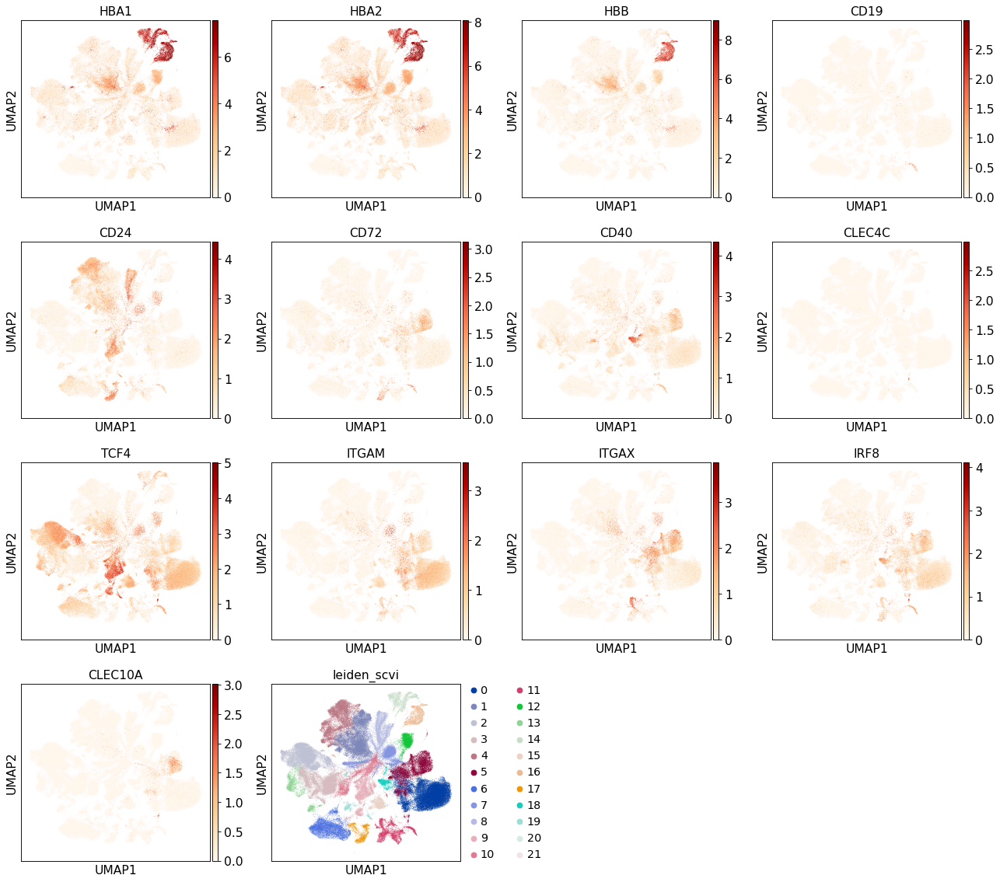

In [41]:
sc.pl.umap(adata, color=['HBA1','HBA2','HBB', #Erythrocyte
                         'CD19','CD24', 'CD72', #B cells
                         'CD40',#macrophage
                         'CLEC4C','TCF4','ITGAM','ITGAX','IRF8','CLEC10A', #DCs
                         'leiden_scvi'],color_map='OrRd')

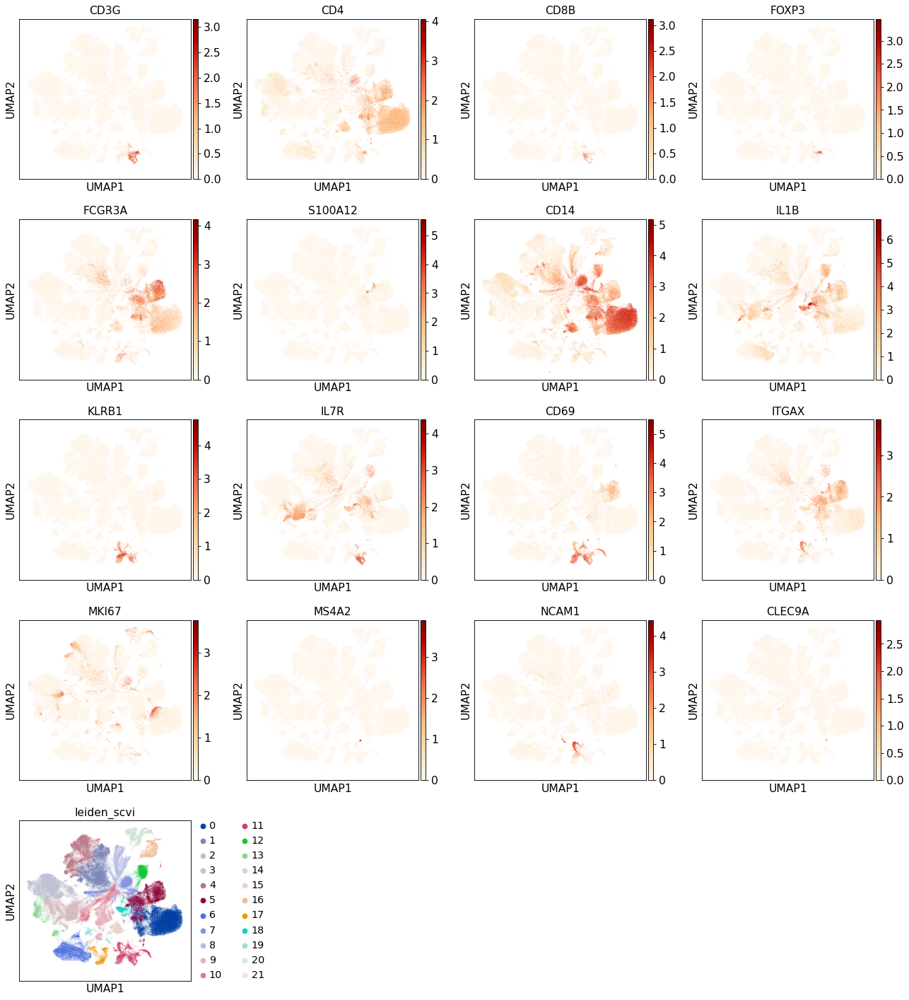

In [34]:
sc.pl.umap(adata, color=[ 'CD3G', 'CD4', 'CD8B', 'FOXP3', 'FCGR3A','S100A12','CD14','IL1B',
                         'KLRB1','IL7R','CD69','ITGAX','MKI67','MS4A2','NCAM1', 'CLEC9A',
                         'leiden_scvi'],color_map='OrRd', save='_deciduaImmuneMarkers_scVI_latent30.pdf')

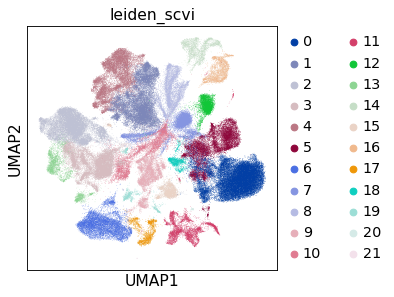

In [37]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], ncols=2, save='_scVI_latent30_clusters.pdf')

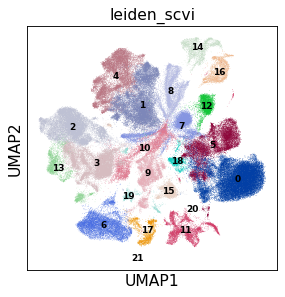

In [38]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], legend_loc='on data',legend_fontsize='xx-small', save='_scVI_latent30_clusters2.pdf')

## Obtaining marker genes

In [35]:
sc.tl.rank_genes_groups(
    adata,
    "leiden_scvi",
    method="wilcoxon",
    use_raw=True,
    key_added="rank_genes_groups_wilcox",
    n_genes=20,
)

ranking genes
    finished: added to `.uns['rank_genes_groups_wilcox']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:11)


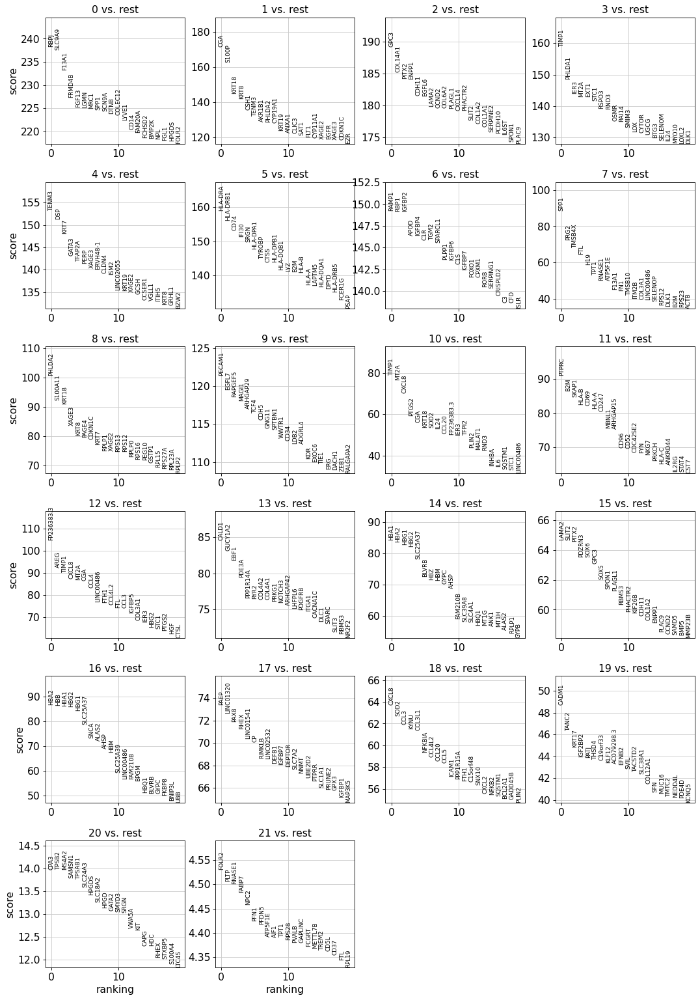

In [36]:
sc.pl.rank_genes_groups(adata, key="rank_genes_groups_wilcox", sharey=False, n_genes=20, show=True)